# UAI521 Bioinformatics part - Task

<b> Biological data procession </b>  

Submitted to: Prof. Radka Symonova, Prof. Marta Vohnoutova <br>
Submitted by: Muhammad Arsalan

## <font color='red'>0. DATA </font>

Downloaded data from ensemble database (Total 25 fasta files divided into 5 folders for each group). Link to the fasta files: https://drive.google.com/drive/folders/1r0VuD4S5hrokQ34Zf89DmC1hVuZewSQw?usp=sharing

**Organisms**

|Organism group|organism|
|---|---|
|Mammalia|Pongo_abelii|
|Mammalia|Sarcophilus_harrisii|
|Mammalia|Ornithorthynchus_anatinus|
|Mammalia|Ursus_maritimus|
|Mammalia|Rattus_norvegicus|
|Aves|Apteryx_haastii|
|Aves|Parus_major|
|Aves|Otus_sunia|
|Aves|Anas_platyrhynchos|
|Aves|Numida_meleagris|
|Molusca|Octupus_bimaculoides|
|Molusca|Lottia_gigantea|
|Molusca|Haliotis_rubra|
|Molusca|Crassostrea_gigas|
|Molusca|Mizuhopecten_yessoensis|
|Osteichthyes|Anabas_testudineous|
|Osteichthyes|Cyprinus_carpio_carpio|
|Osteichthyes|Cottoperca_gobio|
|Osteichthyes|Esox_lucius|
|Osteichthyes|Denticeps_clupeoides|
|Crustacea|Penaeus_monodon|
|Crustacea|Daphnia_magna|
|Crustacea|Pollicipes_pollicipes|
|Crustacea|Hyalella_azteca|
|Crustacea|Lepeophtheirus_salmonis|

<b> Sample Header rows: <b>

|cds ID|cds length|GC%|ENc|GC1|GC2|GC3|
|---|---|---|---|---|---|---|
|XM_018157745.1|	3366|	53.17884729649436|	55.82253358402565|	56.14973262032086|	53.03030303030303|	50.356506238859176|
|XM_018164080.1|	477|	42.9769392|	49.11049404071809|	50.943396226415096|	39.62264150943396|	38.36477987421384|
|XM_018159337.1|	2376|	52.31481481481482|	55.79995614|	54.292929292929294|	46.33838383838384|	56.313131313131315|



## 1. Mounting Drive

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## 2. Installing and importing required libraries

In [2]:
# !pip install Bio
# !pip install codon-bias
import pandas as pd
import numpy as np
import os
import gzip
from Bio.SeqUtils import gc_fraction
from Bio import SeqIO, Seq
import codonbias as cb
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import KMeans
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import LabelEncoder
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D

## 3. Defining functions

In [ ]:
# Function to calculate GC1, GC2, GC3
def calculate_gc123(cds_seq):
    gc1 = gc_fraction(cds_seq[::3])
    gc2 = gc_fraction(cds_seq[1::3])
    gc3 = gc_fraction(cds_seq[2::3])
    return gc1, gc2, gc3

# Function to calculate ENc
def calculate_enc(cds_seq):
    return cb.scores.EffectiveNumberOfCodons().get_score(str(cds_seq))

# Function to process each record and extract required information
def process_record(record):
    cds_id = record.id.split()[0]
    cds_length = len(record.seq)
    gc_percentage = gc_fraction(record.seq)
    gc1, gc2, gc3 = calculate_gc123(record.seq)
    enc_score = calculate_enc(record.seq)

    return {
        'cds ID': cds_id,
        'cds length': cds_length,
        'GC%': gc_percentage,
        'ENC': enc_score,
        'GC1': gc1,
        'GC2': gc2,
        'GC3': gc3,
        'species': file_path.split('/')[-1].split('.')[0],
        'group': file_path.split('/')[-2]
    }

# Function to parse and process a FASTA file
def parse_fasta_file(file_path):
    with gzip.open(file_path, 'rt') as file:  # 'rt' for text mode
        records = SeqIO.parse(file, 'fasta')
        data = [process_record(record) for record in records]
    return data

## 4. Data parsing and creating consolidated dataframe

### i. Serial processing

In [ ]:
# Path to fasta files drive directory
parent_path = '/content/drive/MyDrive/Colab Notebooks/Sem_2_Labs/FE_521/Bioinfo_assignment/fasta files/'

# Get the list of subfolders in the parent path
subfolders = [f.path for f in os.scandir(parent_path) if f.is_dir()]

# Initializing a consolidated dataframe that will contain all data
merged_df = pd.DataFrame()

# Iterate through each subfolder
for subfolder in subfolders:
    print(f"Processing files in {subfolder}")

    # Get the list of files in the current subfolder
    files = [f.path for f in os.scandir(subfolder) if f.is_file()]

    # Parsing each file
    for file_path in files:
        print(f"Processing file: {file_path}")
        organism_data = parse_fasta_file(file_path)
        df = pd.DataFrame(organism_data)

        merged_df = merged_df.append(df, ignore_index=True)

    print("Finished processing files in this subfolder\n")

print("Finished processing all data and merged df created")


Processing files in /content/drive/MyDrive/Colab Notebooks/Sem_2_Labs/FE_521/Bioinfo_assignment/fasta files/Aves
Processing file: /content/drive/MyDrive/Colab Notebooks/Sem_2_Labs/FE_521/Bioinfo_assignment/fasta files/Aves/Anas_platyrhynchos.ASM874695v1.cds.all.fa
Processing file: /content/drive/MyDrive/Colab Notebooks/Sem_2_Labs/FE_521/Bioinfo_assignment/fasta files/Aves/Numida_meleagris.NumMel1.0.cds.all.fa
Processing file: /content/drive/MyDrive/Colab Notebooks/Sem_2_Labs/FE_521/Bioinfo_assignment/fasta files/Aves/Otus_sunia.OtuSun1.0.cds.all.fa
Processing file: /content/drive/MyDrive/Colab Notebooks/Sem_2_Labs/FE_521/Bioinfo_assignment/fasta files/Aves/Parus_major.Parus_major1.1.cds.all.fa
Processing file: /content/drive/MyDrive/Colab Notebooks/Sem_2_Labs/FE_521/Bioinfo_assignment/fasta files/Aves/Apteryx_haastii.aptHaa1.cds.all.fa
Finished processing files in this subfolder

Processing files in /content/drive/MyDrive/Colab Notebooks/Sem_2_Labs/FE_521/Bioinfo_assignment/fasta files

### ii. Parallel programming (Improved results but complex code)

#### a. Parsing script

In [ ]:
%%writefile parallel_parser2.py

import os
import pandas as pd
from mpi4py import MPI
from Bio import SeqIO
from Bio.SeqUtils import gc_fraction
import codonbias as cb


# Set environment variables to allow running as root
OMPI_ALLOW_RUN_AS_ROOT=1
os.environ['OMPI_ALLOW_RUN_AS_ROOT_CONFIRM'] = '1'


# Function to calculate GC1, GC2, GC3
def calculate_gc123(cds_seq):
    gc1 = gc_fraction(cds_seq[::3])
    gc2 = gc_fraction(cds_seq[1::3])
    gc3 = gc_fraction(cds_seq[2::3])
    return gc1, gc2, gc3

# Function to calculate ENc
def calculate_enc(cds_seq):
    return cb.scores.EffectiveNumberOfCodons().get_score(str(cds_seq))

# Function to process each record and extract required information
def process_record(record, file_path):
    cds_id = record.id.split()[0]
    cds_length = len(record.seq)
    gc_percentage = gc_fraction(record.seq)
    gc1, gc2, gc3 = calculate_gc123(record.seq)
    enc_score = calculate_enc(record.seq)

    return {
        'cds ID': cds_id,
        'cds length': cds_length,
        'GC%': gc_percentage,
        'ENC': enc_score,
        'GC1': gc1,
        'GC2': gc2,
        'GC3': gc3,
        'species': file_path.split('/')[-1].split('.')[0],
        'group': file_path.split('/')[-2]
    }

# Function to parse and process a FASTA file
def parse_fasta_file_parallel(file_path):
    with open(file_path, 'rt') as file:
        records = SeqIO.parse(file, 'fasta')
        data = [process_record(record, file_path) for record in records]
    return data

# MPI initialization
comm = MPI.COMM_WORLD
rank = comm.Get_rank()

# Parent path and list of subfolders
parent_path = '/content/drive/MyDrive/Colab Notebooks/Sem_2_Labs/FE_521/Bioinfo_assignment/fasta files/'
subfolders = [f.path for f in os.scandir(parent_path) if f.is_dir()]

# Scatter subfolders to different ranks
subfolders_chunk = None
if rank == 0:
    subfolders_chunk = [subfolders[i:i + len(subfolders) // comm.Get_size()] for i in range(0, len(subfolders), len(subfolders) // comm.Get_size())]

subfolders_chunk = comm.scatter(subfolders_chunk, root=0)

# Process files on each rank
new_df = pd.DataFrame()
for subfolder in subfolders_chunk:
    files = [f.path for f in os.scandir(subfolder) if f.is_file()]

    for file_path in files:
        print(f"Rank {rank} processing file: {file_path}")
        organism_data = parse_fasta_file_parallel(file_path)
        dfa = pd.DataFrame(organism_data)
        new_df = new_df.append(dfa, ignore_index=True)

# Gather results from all ranks
new_df_all = comm.gather(new_df, root=0)

# Concatenate dataframes from all ranks
if rank == 0:
    final_new_df = pd.concat(new_df_all, ignore_index=True)
    print("Finished processing all data and merged df created")


Writing parallel_parser2.py


#### b. script execution

In [ ]:
!mpirun --allow-run-as-root -np 4 python parallel_parser2.py

### 5. Data analysing and pre-processing

In [5]:
# Comparing with given data
merged_df.loc[merged_df['cds ID'].isin(['XM_018157745.1', 'XM_018164080.1', 'XM_018159337.1'])]

,cds ID,cds length,GC%,ENC,GC1,GC2,GC3,species,group
0,XM_018157745.1,0.031580,0.531788,0.886067,0.561497,0.530303,0.503565,Hyalella_azteca,Crustacea
1,XM_018164080.1,0.004354,0.429769,0.703532,0.509434,0.396226,0.383648,Hyalella_azteca,Crustacea
2,XM_018159337.1,0.022250,0.523148,0.885453,0.542929,0.463384,0.563131,Hyalella_azteca,Crustacea


In [6]:
# Checking if ENC values are in the range [20,61]
merged_df.loc[(merged_df['ENC'] >= 61) | (merged_df['ENC'] <= 20)]

,cds ID,cds length,GC%,ENC,GC1,GC2,GC3,species,group
0,XM_018157745.1,0.031580,0.531788,0.886067,0.561497,0.530303,0.503565,Hyalella_azteca,Crustacea
1,XM_018164080.1,0.004354,0.429769,0.703532,0.509434,0.396226,0.383648,Hyalella_azteca,Crustacea
2,XM_018159337.1,0.022250,0.523148,0.885453,0.542929,0.463384,0.563131,Hyalella_azteca,Crustacea
3,XM_018165992.1,0.004156,0.464912,0.869257,0.506579,0.427632,0.460526,Hyalella_azteca,Crustacea
4,XM_018165991.1,0.004156,0.464912,0.869257,0.506579,0.427632,0.460526,Hyalella_azteca,Crustacea
...,...,...,...,...,...,...,...,...,...
1060201,G6851.2,0.009386,0.434224,0.829943,0.489614,0.391691,0.421365,Crassostrea_gigas,Mollusca
1060202,G6851.5,0.010150,0.434982,0.833343,0.489011,0.392857,0.423077,Crassostrea_gigas,Mollusca
1060203,G33380.1,0.001809,0.391304,0.777422,0.420290,0.391304,0.362319,Crassostrea_gigas,Mollusca
1060204,G15377.1,0.017528,0.394667,0.759937,0.446400,0.348800,0.388800,Crassostrea_gigas,Mollusca


- The values of GC%, GC1, GC2, GC3 are not converted into percentile.
- I will leave it as it is since it is normalized in the range [0,1]
- Some species names are mixed with versions.

In [7]:
# Normalizing ENC and cds lengths
merged_df[['cds length', 'ENC']] = MinMaxScaler().fit_transform(merged_df[['cds length', 'ENC']])
merged_df.head(5)

,cds ID,cds length,GC%,ENC,GC1,GC2,GC3,species,group
0,XM_018157745.1,0.031580,0.531788,0.886067,0.561497,0.530303,0.503565,Hyalella_azteca,Crustacea
1,XM_018164080.1,0.004354,0.429769,0.703532,0.509434,0.396226,0.383648,Hyalella_azteca,Crustacea
2,XM_018159337.1,0.022250,0.523148,0.885453,0.542929,0.463384,0.563131,Hyalella_azteca,Crustacea
3,XM_018165992.1,0.004156,0.464912,0.869257,0.506579,0.427632,0.460526,Hyalella_azteca,Crustacea
4,XM_018165991.1,0.004156,0.464912,0.869257,0.506579,0.427632,0.460526,Hyalella_azteca,Crustacea


In [ ]:
# Cleaning species names
merged_df['species'] = merged_df['species'].str.split('_', n=2).str[:2].str.join('_')

In [ ]:
# Checking for nan or 0 values and filtering them
df = merged_df[(merged_df.isna().sum(axis=1) == 0) | (merged_df.eq(0).sum(axis=1) == 0)]
print(f'{merged_df.shape[0] - df.shape[0]} records removed')

0 records removed


### 6. Exporting final dataframe as csvs
Files for different organisms segregated into subfolders by group <br>
Link to csv files: https://drive.google.com/drive/folders/1Cy30itRGkdo32n_Ke3HsY4YBdznAzN8Q?usp=sharing

In [ ]:
output_directory = '/content/drive/MyDrive/Colab Notebooks/Sem_2_Labs/FE_521/Bioinfo_assignment/csv files/'

for org in list(set(df['species'])):
  df_temp = df.loc[df['species'] == org]
  df_temp.to_csv(output_directory + df_temp['group'].reset_index(drop=True)[0] + f'/{org}.csv',index=False)

#### Code chunk to re-import data from those csvs incase runtime crashes

In [ ]:
parent_path = '/content/drive/MyDrive/Colab Notebooks/Sem_2_Labs/FE_521/Bioinfo_assignment/csv files/'

# Get the list of subfolders in the parent path
subfolders = [f.path for f in os.scandir(parent_path) if f.is_dir()]
df = pd.DataFrame()
for subfolder in subfolders:
    print(f"Processing files in {subfolder}")

    # Get the list of files in the current subfolder
    files = [f.path for f in os.scandir(subfolder) if f.is_file()]

    # Parsing each file
    for file_path in files:
        if file_path.split('\\')[-1] != 'desktop.ini':
            print(f"Processing file: {file_path}")

            df2 = pd.read_csv(file_path)

            df = df.append(df2, ignore_index=True)

### 7. Visualizing data distribution

#### Stacked chart

In [9]:
stacked_df = df.groupby(['group', 'species']).size().unstack()
fig = px.bar(stacked_df, barmode='stack', labels={'value': 'Count', 'index': 'Group'}, title='Stacked Bar Chart')


fig.update_layout(
    xaxis=dict(title='Group'),
    yaxis=dict(title='Count'),
    hovermode='x',
    legend_title='Species',
    showlegend=True,
    width=800,
    height=500
)

fig.show()


#### Histograms

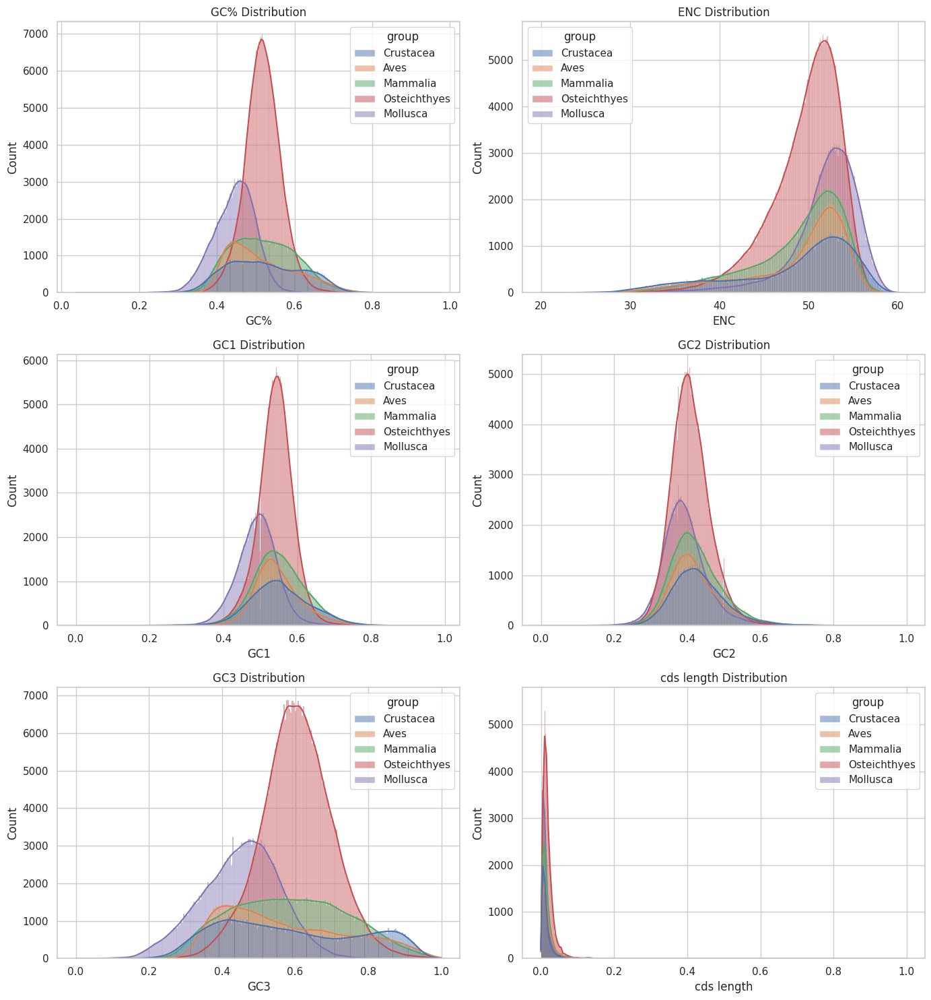

In [21]:
# Set the style for seaborn
sns.set(style="whitegrid")

# Set up the subplots
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(14, 15))

# GC% Distribution - Histogram
sns.histplot(df, x='GC%', hue='group', kde=True, ax=axes[0, 0])
axes[0, 0].set_title('GC% Distribution')

# Denormalize the 'ENC' column
ENC = df['ENC'] * (61 - 20) + 20

# ENC Distribution - Histogram
sns.histplot(df, x=ENC, hue='group', kde=True, ax=axes[0, 1])
axes[0, 1].set_title('ENC Distribution')

# GC1 Distribution - Histogram
sns.histplot(df, x='GC1', hue='group', kde=True, ax=axes[1, 0])
axes[1, 0].set_title('GC1 Distribution')

# GC2 Distribution - Histogram
sns.histplot(df, x='GC2', hue='group', kde=True, ax=axes[1, 1])
axes[1, 1].set_title('GC2 Distribution')

# GC3 Distribution - Histogram
sns.histplot(df, x='GC3', hue='group', kde=True, ax=axes[2, 0])
axes[2, 0].set_title('GC3 Distribution')

# cds length Distribution - Histogram
sns.histplot(df, x='cds length', hue='group', kde=True, ax=axes[2, 1])
axes[2, 1].set_title('cds length Distribution')

plt.tight_layout()
plt.show()


#### Pairplots
Providing comprehensive outlook for 2D distribution between each pair of feature. The huge amount of data makes it visually blend

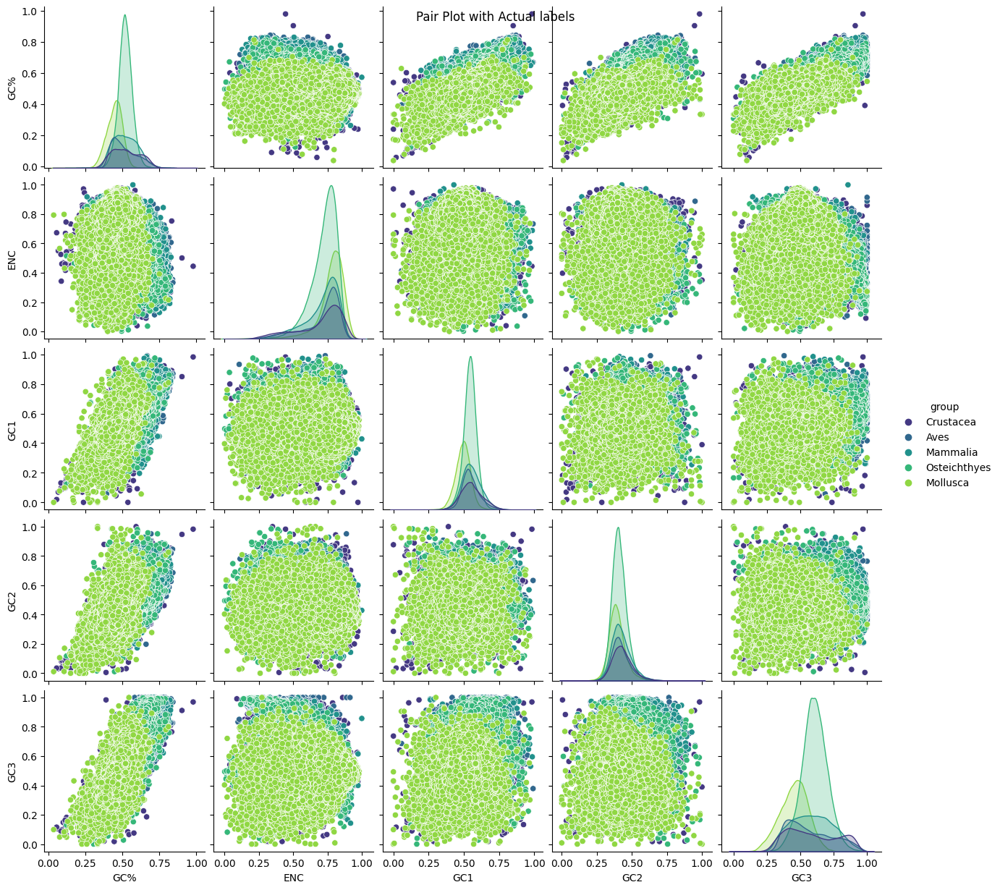

In [23]:
sns.pairplot(df, hue='group', palette='viridis', vars=['GC%', 'ENC', 'GC1', 'GC2', 'GC3'])
plt.suptitle('Pair Plot with Actual labels')
plt.show()

#### Feature-correlation heatmap

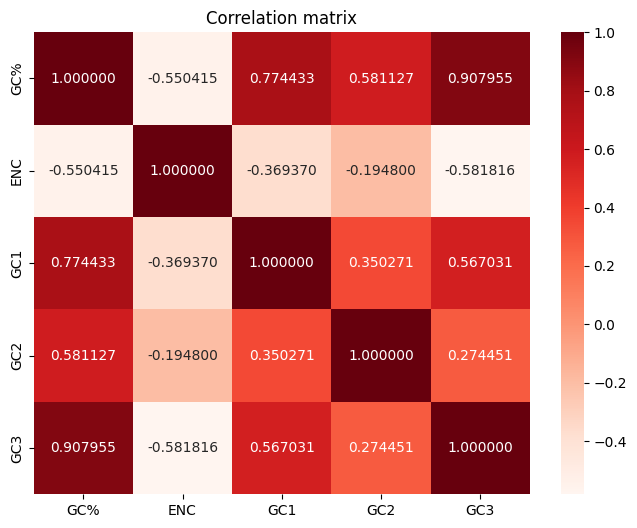

In [15]:
df[['GC%','ENC','GC1','GC2','GC3']].corr()

# Create a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(df[['GC%','ENC','GC1','GC2','GC3']].corr(), annot=True, fmt='f', cmap='Reds', xticklabels=['GC%','ENC','GC1','GC2','GC3'], yticklabels=['GC%','ENC','GC1','GC2','GC3'])
plt.title('Correlation matrix')
plt.show()

#### Labels - correlation with each feature
i.e., how much each feature impacts the choice of group or species

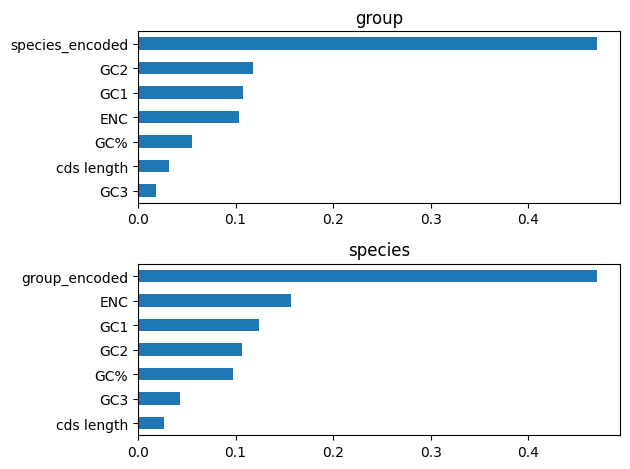

In [23]:
from sklearn.preprocessing import LabelEncoder

df_encoded = df.copy()

# Label encode the 'group' column
label_encoder = LabelEncoder()
df_encoded['group_encoded'] = label_encoder.fit_transform(df['group'])

# Label encode the 'species' column
label_encoder = LabelEncoder()
df_encoded['species_encoded'] = label_encoder.fit_transform(df['species'])

# Calculate the correlation
correlation_matrix = df_encoded.corr(numeric_only=1)

# Get the correlation of each feature with the encoded target
target1_correlation = correlation_matrix['group_encoded'].drop('group_encoded')
target2_correlation = correlation_matrix['species_encoded'].drop('species_encoded')

# Plot the correlations
plt.subplot(211)
target1_correlation.abs().sort_values().plot(kind='barh')
plt.title('group')

plt.subplot(212)
target2_correlation.abs().sort_values().plot(kind='barh')
plt.title('species')

plt.tight_layout()
plt.show()


#### 3D scatterplot
Based on ENC GC1 GC2 that are most effective features among others

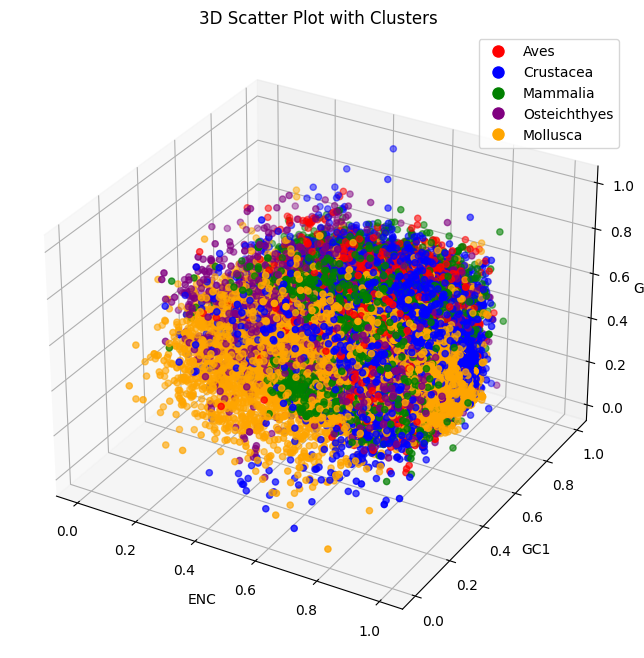

In [32]:
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

group_colors = {'Aves': 'red', 'Crustacea': 'blue', 'Mammalia': 'green', 'Osteichthyes': 'purple', 'Mollusca': 'orange'}

scatter = ax.scatter(df['ENC'], df['GC1'], df['GC2'], c=df['group'].map(group_colors))

ax.set_xlabel('ENC')
ax.set_ylabel('GC1')
ax.set_zlabel('GC2')
ax.set_title('3D Scatter Plot with Clusters')

# Create a custom legend
legend_labels = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10, label=group) for group, color in group_colors.items()]
ax.legend(handles=legend_labels)

plt.show()


### 8. Clustering

Pretending that we don't know the actual group names and applying kMeans to see how well it perform based on the given feature values.

#### Fitting

In [ ]:
X = df[['GC%', 'ENC', 'GC1', 'GC2', 'GC3']]
kmeans = KMeans(n_clusters=5)
X['cluster'] = kmeans.fit_predict(X)

#### Visualizing performance using confusion matrix

Applying Hungarian algorithm to estimate cost for each assignment so that cluster labels can be identical to the encoded actual labels

In [ ]:
from sklearn.metrics import confusion_matrix
from scipy.optimize import linear_sum_assignment


true_labels = df_encoded['group_encoded']
cluster_labels = X['cluster']

# Create a cost matrix (negative similarity for minimization)
cost_matrix = -1 * np.array([[np.sum((true_labels == i) & (cluster_labels == j)) for j in range(5)] for i in range(5)])

# Use the Hungarian algorithm to find the optimal assignment
row_ind, col_ind = linear_sum_assignment(cost_matrix)

# Create the confusion matrix based on the optimal assignment
conf_matrix = confusion_matrix(true_labels, [col_ind[cluster] for cluster in cluster_labels])


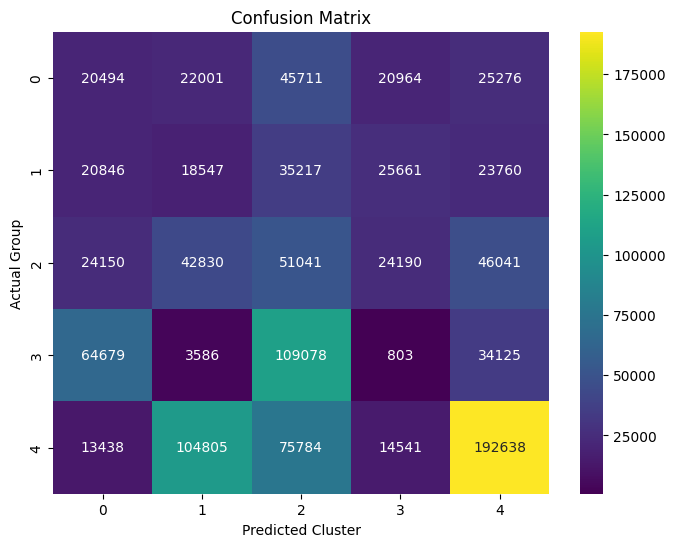

In [49]:
# Create a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='viridis')
plt.xlabel('Predicted Cluster')
plt.ylabel('Actual Group')
plt.title('Confusion Matrix')
plt.show()

#### Accuracy

In [51]:
misclass = 0
for i, n in enumerate(conf_matrix):
  for j, m in enumerate(n):
    if (j != i and m>0):
      misclass += m

print(f'Classification accuracy= {(1- misclass/len(X)) * 100}%')

Classification accuracy= 26.742255750297584%


#### Pairplot after clustering

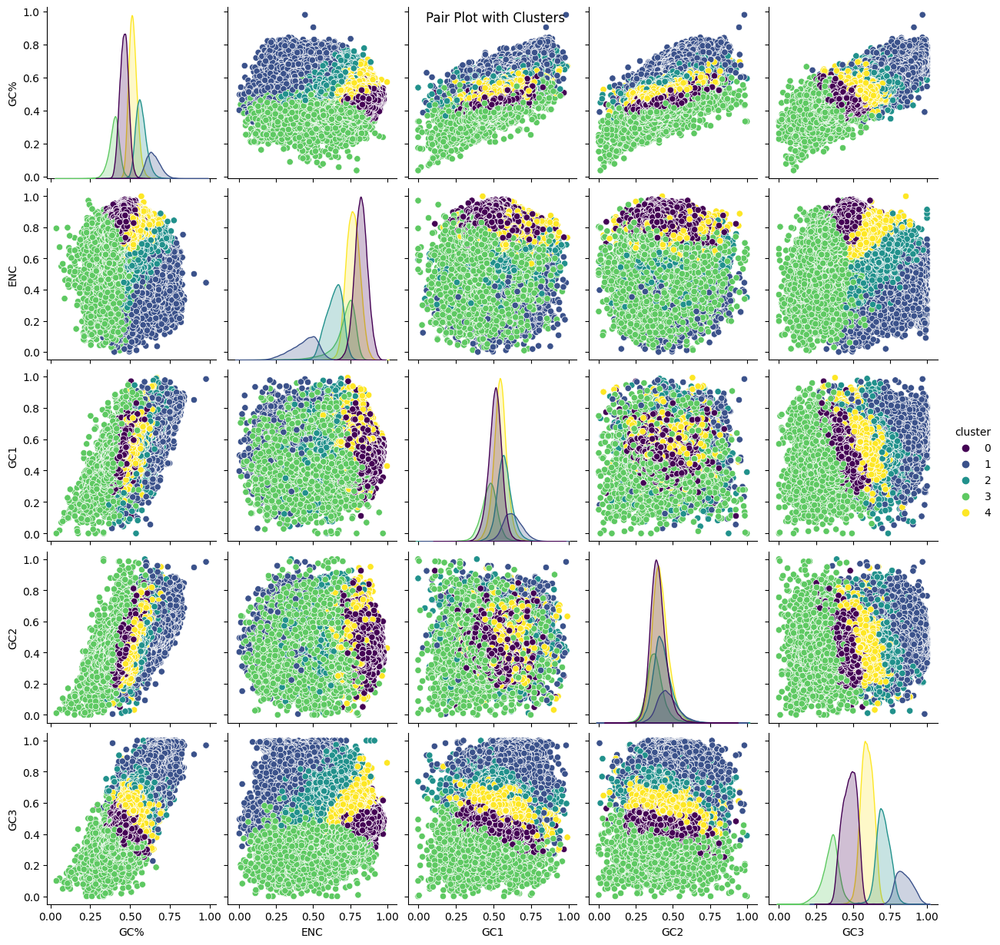

In [13]:
sns.pairplot(X, hue='cluster', palette='viridis', vars=['GC%', 'ENC', 'GC1', 'GC2', 'GC3'])
plt.suptitle('Pair Plot with Clusters')
plt.show()

### 9. Dimensionality reduction (PCA)

In [7]:
features = X[['GC%', 'ENC', 'GC1', 'GC2', 'GC3',]]

# Apply PCA
pca = PCA(n_components=2)
pca_result = pca.fit_transform(features)

#### PCA scatter plot

Shows comparison between Actual labels and labels provided by kMeans. <br>
(KMeans overfitted the data in order to make distinct cluster boundaries and hence very low classification accuracy)

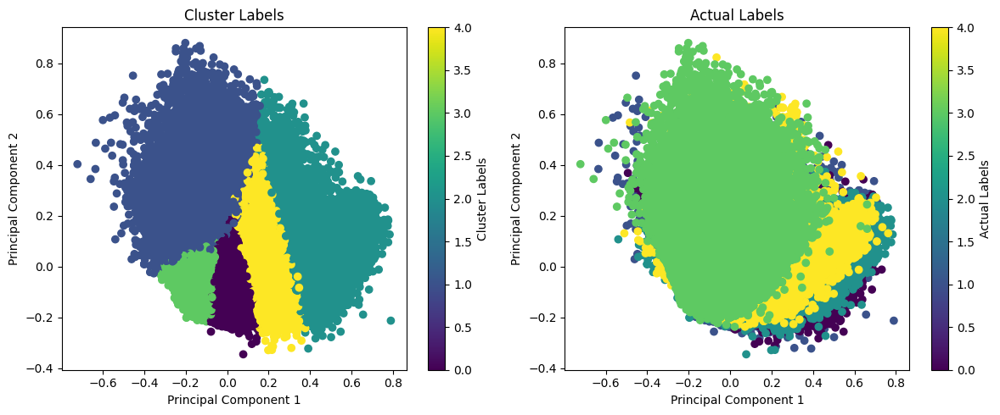

In [34]:
plt.figure(figsize=(12, 5))

# Plot with cluster labels as colors
plt.subplot(1, 2, 1)
plt.scatter(pca_result[:, 0], pca_result[:, 1], c=X['cluster'], cmap='viridis')
plt.title('Cluster Labels')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.colorbar(label='Cluster Labels')

# Plot with actual labels as colors
plt.subplot(1, 2, 2)
plt.scatter(pca_result[:, 0], pca_result[:, 1], c=df['group'].astype('category').cat.codes, cmap='viridis')
plt.title('Actual Labels')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.colorbar(label='Actual Labels')

plt.tight_layout()
plt.show()


For application of t-SNE, dataset is too large. <br>
We got an idea of the data and its nature. I will proceed with truncating the data and dive into further analysis.

### 10. Truncating data

2500 records of each specie. Total 62,500 records. (Still a large number)

In [5]:
truncated_dfs = []

# Group by 'species' and sample 2500 values from each group
for species, group_df in df.groupby('species'):
    truncated_dfs.append(group_df.sample(min(2500, len(group_df)), random_state=42))

# Concatenate the truncated DataFrames into a new DataFrame
truncated_df = pd.concat(truncated_dfs)

# Reset index for the new DataFrame
truncated_df.reset_index(drop=True, inplace=True)


In [52]:
truncated_df

,cds ID,cds length,GC%,ENC,GC1,GC2,GC3,species,group
0,ENSATET00000047760.1,0.013966,0.528390,0.780285,0.587174,0.448898,0.549098,Anabas_testudineus,Osteichthyes
1,ENSATET00000020788.2,0.054367,0.536134,0.740788,0.553942,0.429461,0.625000,Anabas_testudineus,Osteichthyes
2,ENSATET00000045455.1,0.031184,0.484958,0.481852,0.499097,0.370036,0.585740,Anabas_testudineus,Osteichthyes
3,ENSATET00000036672.2,0.011987,0.506605,0.793046,0.517483,0.473193,0.529138,Anabas_testudineus,Osteichthyes
4,ENSATET00000043899.1,0.013033,0.507153,0.730231,0.512876,0.373391,0.635193,Anabas_testudineus,Osteichthyes
...,...,...,...,...,...,...,...,...,...
62495,ENSUMAT00000003468.1,0.006163,0.532138,0.775699,0.533632,0.430493,0.632287,Ursus_maritimus,Mammalia
62496,ENSUMAT00000015401.1,0.020045,0.608777,0.415652,0.589636,0.408964,0.827731,Ursus_maritimus,Mammalia
62497,ENSUMAT00000007170.1,0.013090,0.410969,0.785791,0.497863,0.384615,0.350427,Ursus_maritimus,Mammalia
62498,ENSUMAT00000024449.1,0.007294,0.471483,0.827698,0.562738,0.410646,0.441065,Ursus_maritimus,Mammalia


### 11. Interactive visualization (Species and Groups)

In [54]:
fig = px.scatter_3d(truncated_df, x='GC1', y='GC2', z='ENC', color='group', symbol='species',
                    labels={'GC1': 'GC1', 'GC2': 'GC2', 'ENC': 'ENC'},
                    title='3D Scatter Plot')
fig.show()


### 12. Clustering on truncated data

In [ ]:
X_t = truncated_df[['GC%', 'ENC', 'GC1', 'GC2', 'GC3']]
kmeans = KMeans(n_clusters=5)
X_t['cluster'] = kmeans.fit_predict(X_t)

#### Visualizing performance using confusion matrix

Applying Hungarian algorithm to estimate cost for each assignment so that cluster labels can be identical to the encoded actual labels

In [6]:
truncated_df_encoded = truncated_df.copy()

# Label encode the 'group' column
label_encoder = LabelEncoder()
truncated_df_encoded['group_encoded'] = label_encoder.fit_transform(truncated_df['group'])

# Label encode the 'species' column
truncated_df_encoded['species_encoded'] = label_encoder.fit_transform(truncated_df['species'])


In [57]:
true_labels = truncated_df_encoded['group_encoded']
cluster_labels = X_t['cluster']

# Create a cost matrix (negative similarity for minimization)
cost_matrix = -1 * np.array([[np.sum((true_labels == i) & (cluster_labels == j)) for j in range(5)] for i in range(5)])

# Use the Hungarian algorithm to find the optimal assignment
row_ind, col_ind = linear_sum_assignment(cost_matrix)

# Create the confusion matrix based on the optimal assignment
conf_matrix = confusion_matrix(true_labels, [col_ind[cluster] for cluster in cluster_labels])


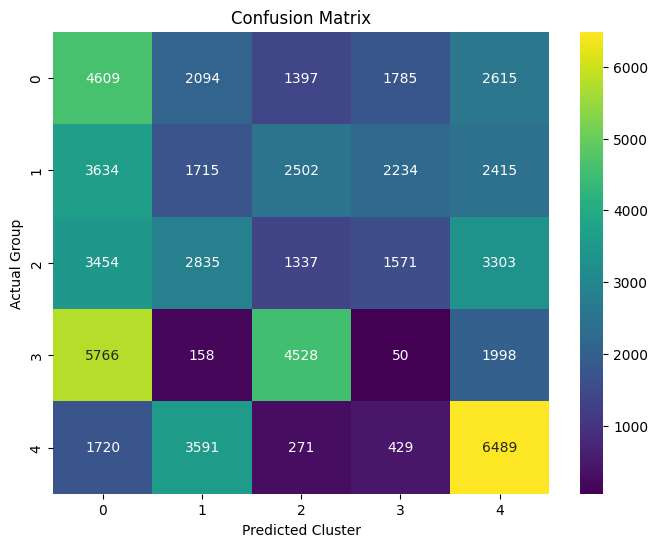

In [58]:
# Create a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='viridis')
plt.xlabel('Predicted Cluster')
plt.ylabel('Actual Group')
plt.title('Confusion Matrix')
plt.show()

#### Accuracy

In [59]:
misclass = 0
for i, n in enumerate(conf_matrix):
  for j, m in enumerate(n):
    if (j != i and m>0):
      misclass += m

print(f'Classification accuracy= {(1- misclass/len(X_t)) * 100}%')

Classification accuracy= 22.719999999999995%


Nothing got better. And it makes sense.

#### Pairplot after clustering (truncated)

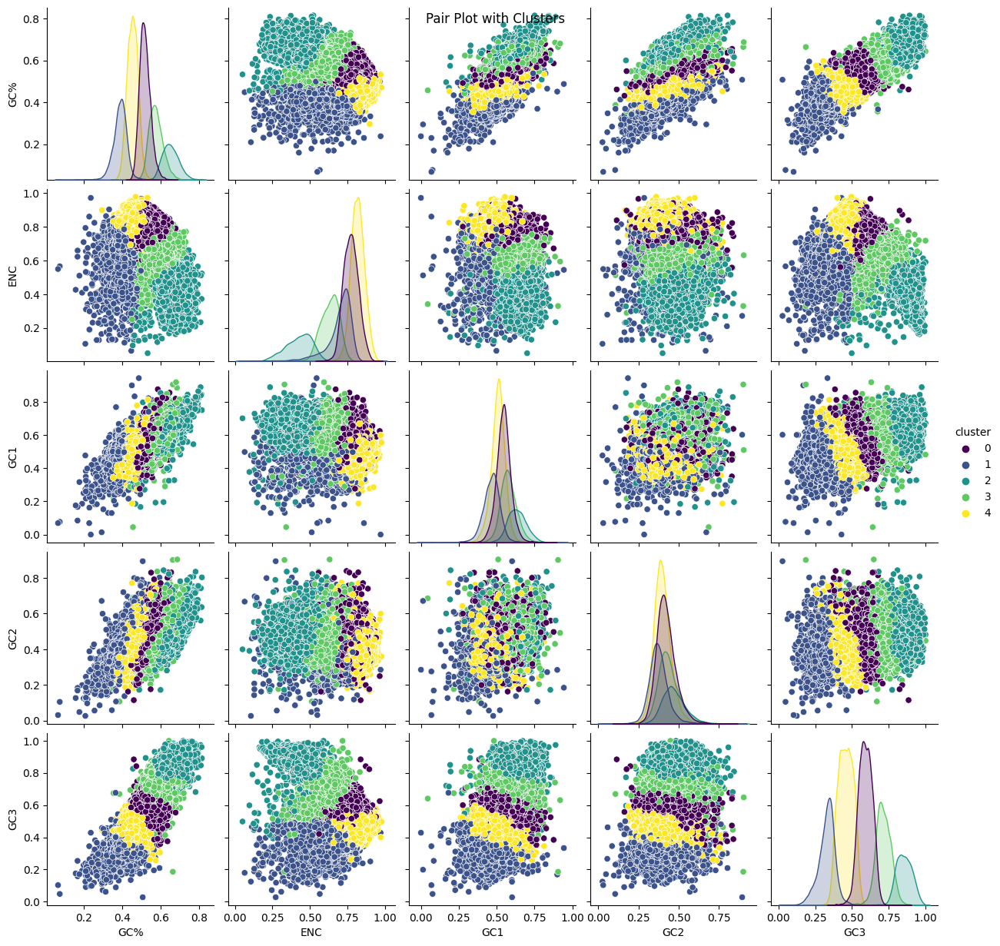

In [60]:
sns.pairplot(X_t, hue='cluster', palette='viridis', vars=['GC%', 'ENC', 'GC1', 'GC2', 'GC3'])
plt.suptitle('Pair Plot with Clusters')
plt.show()

### 13. Dimensionality reduction - truncated (PCA)

In [9]:
features = X_t[['GC%', 'ENC', 'GC1', 'GC2', 'GC3']]

# Apply PCA
pca = PCA(n_components=2)
pca_result = pca.fit_transform(features)

#### PCA scatter plot

Shows comparison between Actual labels and labels provided by kMeans. <br>
(KMeans overfitted the data in order to make distinct cluster boundaries and hence very low classification accuracy) <br>
Lots of misclassification

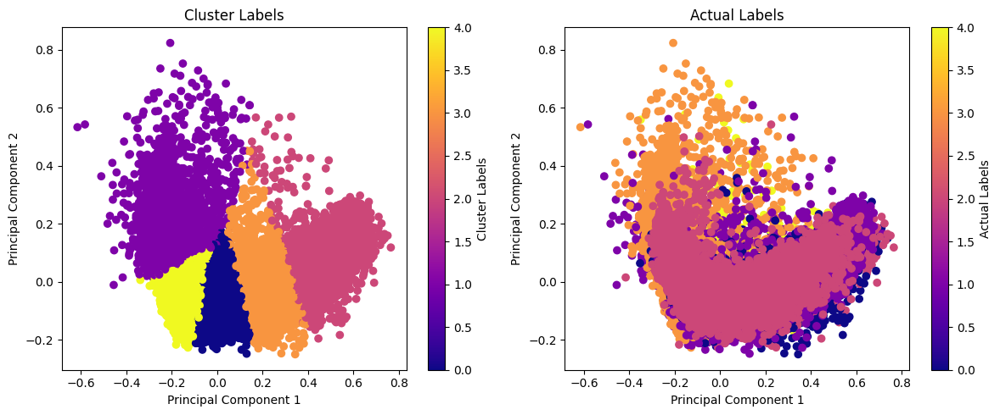

In [64]:
plt.figure(figsize=(12, 5))

# Plot with cluster labels as colors
plt.subplot(1, 2, 1)
plt.scatter(pca_result[:, 0], pca_result[:, 1], c=X_t['cluster'], cmap='plasma')
plt.title('Cluster Labels')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.colorbar(label='Cluster Labels')

# Plot with actual labels as colors
plt.subplot(1, 2, 2)
plt.scatter(pca_result[:, 0], pca_result[:, 1], c=truncated_df['group'].astype('category').cat.codes, cmap='plasma')
plt.title('Actual Labels')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.colorbar(label='Actual Labels')

plt.tight_layout()
plt.show()


### 14. Dimensionality reduction - truncated (t-SNE)

In [65]:
# Apply t-SNE
tsne = TSNE(n_components=2, random_state=42)
tsne_result = tsne.fit_transform(features)
tsne_result

array([[ 18.281338, -88.83642 ],
       [ 47.549194, -45.62757 ],
       [ 21.152317,  70.15973 ],
       ...,
       [-50.37862 ,  53.5945  ],
       [-69.99374 , -28.139315],
       [-80.59506 , -13.176465]], dtype=float32)

#### t-SNE scatter plot

Shows comparison between Actual labels and labels provided by kMeans. <br>
(KMeans overfitted the data in order to make distinct cluster boundaries and hence very low classification accuracy) <br>
Lots of misclassification

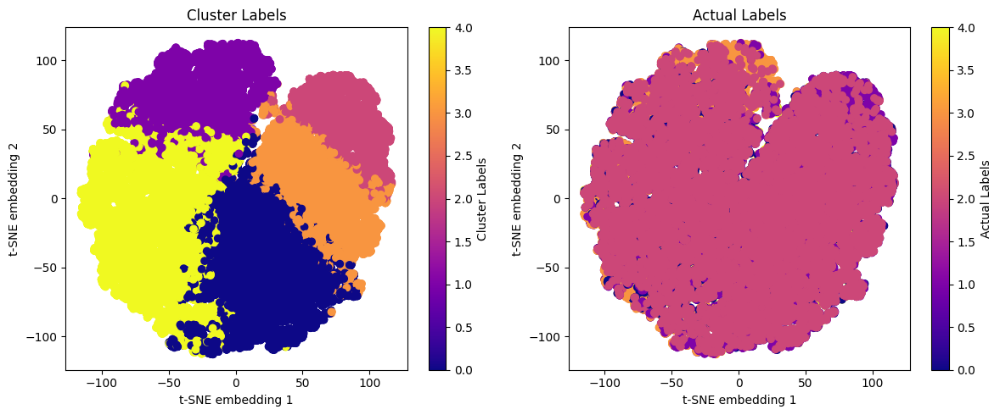

In [66]:
plt.figure(figsize=(12, 5))

# Plot with cluster labels as colors
plt.subplot(1, 2, 1)
plt.scatter(tsne_result[:, 0], tsne_result[:, 1], c=X_t['cluster'], cmap='plasma')
plt.title('Cluster Labels')
plt.xlabel('t-SNE embedding 1')
plt.ylabel('t-SNE embedding 2')
plt.colorbar(label='Cluster Labels')

# Plot with actual labels as colors
plt.subplot(1, 2, 2)
plt.scatter(tsne_result[:, 0], tsne_result[:, 1], c=truncated_df['group'].astype('category').cat.codes, cmap='plasma')
plt.title('Actual Labels')
plt.xlabel('t-SNE embedding 1')
plt.ylabel('t-SNE embedding 2')
plt.colorbar(label='Actual Labels')

plt.tight_layout()
plt.show()

Due to overlap, segregating each group plot

<ipython-input-68-76326dd0bb73>:15: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored

<ipython-input-68-76326dd0bb73>:25: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



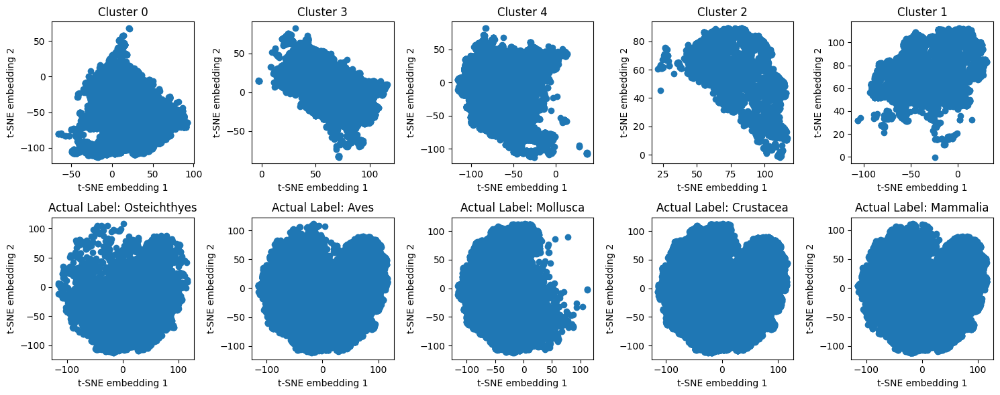

In [68]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the number of rows and columns for subplots
n_rows = 2
n_cols = 5

# Create subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 6))

# Plot with cluster labels as colors
for i, ax in enumerate(axes[0]):
    group_name = X_t['cluster'].unique()[i]
    subset = tsne_result[X_t['cluster'] == group_name]
    ax.scatter(subset[:, 0], subset[:, 1])
    ax.set_title(f'Cluster {group_name}')
    ax.set_xlabel('t-SNE embedding 1')
    ax.set_ylabel('t-SNE embedding 2')
    # ax.colorbar(label='Cluster Labels')

# Plot with actual labels as colors
for i, ax in enumerate(axes[1]):
    group_name = truncated_df['group'].unique()[i]
    subset = tsne_result[truncated_df['group'] == group_name]
    ax.scatter(subset[:, 0], subset[:, 1])
    ax.set_title(f'Actual Label: {group_name}')
    ax.set_xlabel('t-SNE embedding 1')
    ax.set_ylabel('t-SNE embedding 2')
    # ax.colorbar(label='Actual Labels')

plt.tight_layout()
plt.show()


t-SNE performed worse than PCA in terms of segregation but infact with the nature of the data that has large spread with no distinct boundaries to identify actual groups in a scatter plot, t-SNE did well to preserve global structure but interpretability is extremely bad.

### 15. CONCLUSION

#### Code flow

- Imported all relevant libraries
- Defined 4 functions that collectively parse all the fasta files and write them into csvs with the required manipulation of data.
- The fasta files are parsed in a for loop such that each file is parsed, converted into a dataframe and all the dataframes are merged into a final consolidated dataframe that contains all the data of 25 species.
- To improve the performance and speed, parallel programming application is considered for the parsing process.
- Data is checked for accuracy, nan values and other required checks, preprocessing and cleaning.
- The consolidated dataframe is then exported into 25 csvs each for a specie.
- A backup code chunk is also used to re-import from the created csvs back into a consolidated dataframe incase the runtime crashes.
- Different visualizations on the data is performed to understand the distribution of data (for discussion, see [Key Takeaways])
- Correlations between variables are analysed.
- KMeans clustering algorithm is used to utilize feature in an attempt to categorize them into distinct clusters.
- Comparison is drawn with the actual labels.
- Dimensionality reduction technique like 2D PCA is employed. Labels are then re-visualized.
- Size of the data is truncated for further analysis. (2500 records for each species).
- Clustering is performed and Dimensionality reduction (PCA and t-SNE) are performed again on dimensionally reduced data.
- Conclusion is made.




#### Key Takeaways

- Histograms: Osteichthyes has the highest number of records. Except GC3, all other features are similarly distributed for all group of organisms. This already means that clustering algorithm when implemented might not result in better classification results. GC3 is spread across wider range and actually different range for different groups implying that if clusters are segregated on the basis of GC3, we might see distinct boundaries.

- Pairplots: Pairplots provided a comprehensive 2D outlook for features among each other. As expected, the clusters are hardly distinguishable. Crustacea are seen to be more dispersed for every features pair. This simply means that utilizing ENC, GC%, GC1, GC2, and GC3 are not enough to distinguish an organism or a specie. If they are distinguished still, the chances of misclassification are high.

- Feature correlation heatmap: It is observed that GC% and GC3 are in strong positive correlation. while ENC and GC3 are in moderate negative correlation. Other correlations are similarly observable from the heatmap.

- Labels correlation: I did this test to understand that the choice of label or simply the name of organism or its group is how strongly correlated to the features. The top 3 features are then used to plot a 3d scatter plot i.e., GC1 GC2 and ENC.

- 3D Scatterplot: The 3D scatterplot again shows that crustaceans are in wider spread than groups like Mollusca. Mollusca has generally smaller values of GC1 while Crustaceans have higher ENC values. Mammals are concentrated in the middle right at the overlapping region. Birds also typically have higher GC1 values. Osteichthyes whatever is observable have higher GC2 values.

- Clustering: KMeans clustering is employed to see how well the model is able to cluster the like organisms together. To check the accuracy, confusion matrix heatmap is visualized which yielded expected results. Here i used hungarian algorithm where i matched the newly created cluster label indices with actual label encodings. The confusion matrix in general presented that KMeans didnt yield appreciable results. Classification accuracy of our KMeans clustering model is only around 27%.

- Pairplots: The pairplots after clustering yielded interesting results. While our actual data is blended with one another and it is very difficult to segregate organism groups, the KMeans attempted to draw distinct boundaries between the clusters and that is the reason the overlapping region has huge misclassification ratio. The paiplots between each feature-pair is showing distinct cluster boundaries. While it looks promising but the generalization will be really bad. If i provide a test data to this clustering, the algorithm is expected to misclassify a specie or a group even 73% of the times.

- 2D PCA visualization: Dimensionality reduction is an ideal technique if the feature map is large. Here i employed 2D PCA visualization so that in simpler terms the segregation of classes can be seen to be dependent on two distinct features. Upon visualizing, again the actual labels data is overlapped largely while PCA clustered have distinct boundaries. PCA did better in simplifying the visuals but it lost the data's global structure.

At this point, i felt a need to truncate the data to see if i observe patterns owing to smaller size of data. Truncated data has 2500 records for each species.

- Interactive 3D Scatterplot: The plot is giving a comprehensive idea of spatial position of each species in a ENC-GC1-GC2 space. <br>Organisms like
* Lottia_gigantea,
* Mizuhopecten_yessoensis,
* Pongo_abelii,
* Penaeus_monodon,
* Hyalella_azteca,
* Lepeophtheirus_salmonis,
* Otus_sunia,
* Cottoperca_gobio,
* Esox_lucius <br>
are seen dispersed from an overall condensed space tells us that they can be comparatively easy to segregate among other organisms.
<br>Also, there is an interesting observation:<br>

- Following organisms are inter-mingled in scatterplot and upon researching about them they are indeed similar on atleast some levels while belonging to different groups:<br>

* Pongo abelii (Mammalia) and Otus sunia (Aves):<br>
Both are vertebrates with complex behavior and are warm-blooded.
* Ornithorhynchus anatinus (Mammalia) and Anas platyrhynchos (Aves):<br>
Both are vertebrates with feathers and lay eggs, despite belonging to different classes.
* Octopus bimaculoides (Mollusca) and Penaeus monodon (Crustacea):<br>
Both are aquatic organisms with exoskeletons, although their structures and habitats differ.

- Pairplots of truncated clustering: Though i implemented KMeans again on clustering data to see if it performs better in terms of lesser overfitting but still the boundaries are distinct.

- PCA and t-SNE: PCA is again implemented. Similar discrepancy is observed. Actual labels are overlapped while Clusters are distinct. When t-SNE is implemented, Extreme overlapping is observed in case of actual labels. To visualize it better i separated the plot for each organism group. It showed that t-SNE almost showed similar spread of datapoints across its dimensions for all organism groups and it made even more difficult to distinguish. But t-SNE atleast preserved the global structure or spread of datapoints.
<br>
In conclusion, to implement further ML models or cluster data in an attempt to distinguish species and organism groups based on the above used feature values, I feel that only using these features may not be enough. Or we need to implement further fine-tuning techniques. Maybe more data that has distinguishable characteristics can also help. But the interesting insights were drawn from the plot of actual data i.e., the intereactive 3d plot that unfolded the organisms close to each other in scatterplot are indeed similar atleast in some way and that is what i think our goal is to find out.